In [52]:
import os
import matplotlib.pyplot as plt

from astropy.io import fits
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt

import numpy as np

In [39]:
fdir = '/Volumes/preKAMP2022/ZN988_2022/CTIO/I'
fnames = [f for f in os.listdir(fdir) if f.endswith('0001.resamp.fits.fz')]
fnames.sort()

In [42]:
fname

'cbftoxkmtc.20220102.032722.new.0001.resamp.fits.fz'

In [53]:
def annular_mask(shape, center, r_inner, r_outer):
    """Create an annular mask around the given center."""
    y, x = np.ogrid[:shape[0], :shape[1]]
    r = np.sqrt((x - center[1])**2 + (y - center[0])**2)
    return (r >= r_inner) & (r <= r_outer)

def estimate_background(image, mask):
    """Estimate background using the median of masked region."""
    return np.median(image[mask])

def process_cutout(filename, r_inner=15, r_outer=25, show_plot=False):
    """Load, subtract background, and return normalized image."""
    with fits.open(filename) as hdul:
        data = hdul[1].data
        header = hdul[1].header

    # Estimate background
    center = (data.shape[0] // 2, data.shape[1] // 2)
    mask = annular_mask(data.shape, center, r_inner, r_outer)
    background = estimate_background(data, mask)

    # Subtract background
    normalized_data = data - background

    # Optionally show
    if show_plot:
        plt.figure()
        plt.imshow(normalized_data, origin='lower', cmap='gray')
        plt.title(f'Background-Subtracted: {os.path.basename(filename)}')
        plt.colorbar(label='Flux')
        plt.show()

    return normalized_data, header

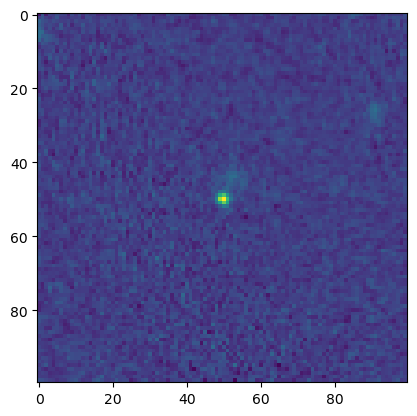

In [64]:
plt.imshow(normalized_data)

In [72]:
from scipy.ndimage import median_filter

smoothed_data = median_filter(normalized_data, size=3)  # 3x3 window

/usr/local/anaconda3/envs/LAAKE/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 1000x1000 with 0 Axes>

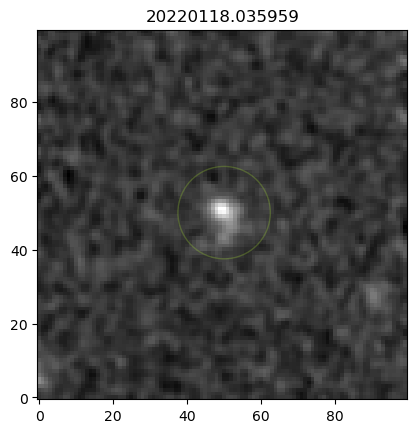

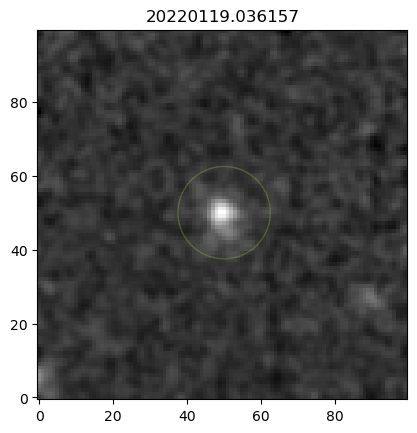

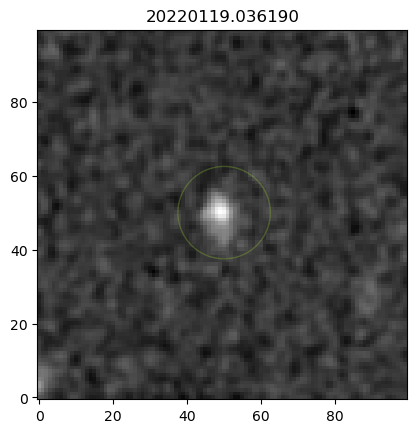

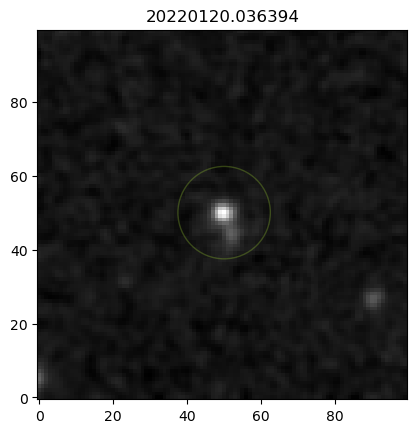

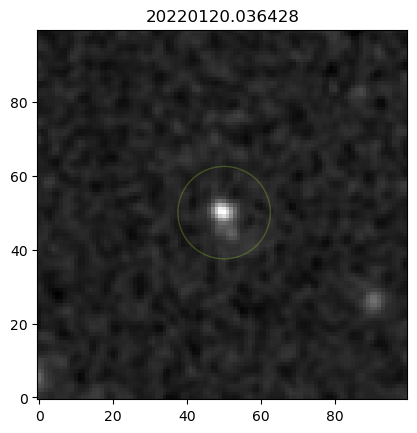

...

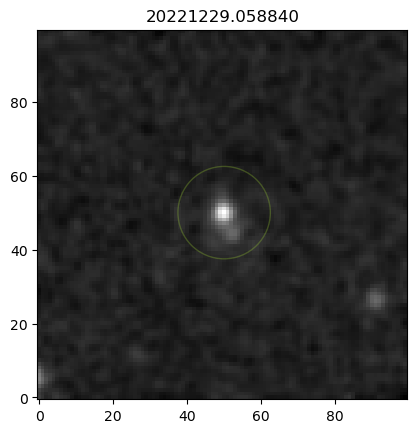

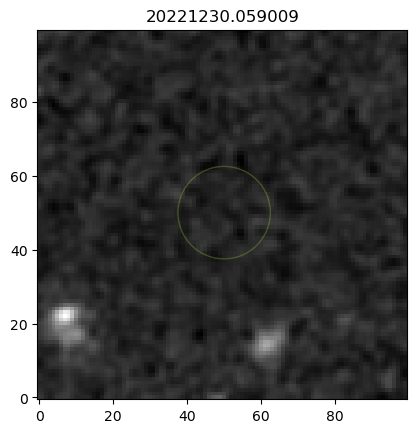

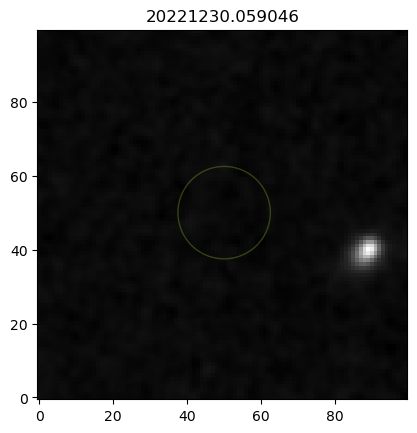

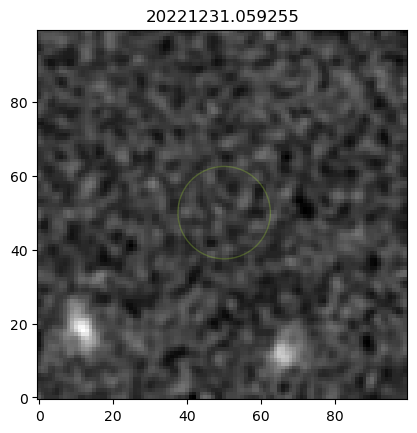

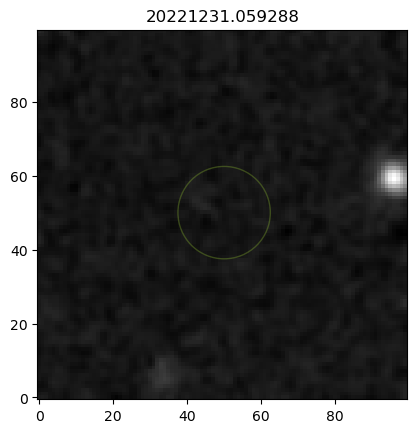

In [128]:
plt.figure(figsize=(10,10))

# Load the FITS file
for fname in fnames[20:] :
    fpath = os.path.join(fdir, fname)

    hdul = fits.open(fpath)
    data = hdul[1].data
    wcs = WCS(hdul[1].header)

    # Define the sky coordinate of the cutout center
    position = SkyCoord(ra=39.9692458*u.deg, dec=-8.6817378*u.deg, frame='icrs')

    # Define the cutout size in pixels
    size = (100, 100)  # (ny, nx)

    # Create the cutout
    cutout = Cutout2D(data, position, size, wcs=wcs)
    
    r_inner, r_outer=20, 30

    center = (cutout.data.shape[0] // 2, cutout.data.shape[1] // 2)
    mask = annular_mask(cutout.data.shape, center, r_inner, r_outer)
    background = estimate_background(cutout.data, mask)

    # Subtract background
    normalized_data = cutout.data - background
    #smoothed_data = median_filter(normalized_data, size=2)
    smoothed_data = gaussian_filter(normalized_data, sigma=1)
    
    image_id = '.'.join(fname.split('.')[1:3])

    # Plot the cutout
    plt.figure()
    center_x, center_y = 50,50
    radius = 5/0.4

    # Add the circle to the plot
    circle = plt.Circle((center_x, center_y), radius, fill=False, edgecolor='yellowgreen', alpha=0.3)
    plt.gca().add_patch(circle)
    plt.imshow(smoothed_data, origin='lower', cmap='gray')
    plt.title(image_id)
    plt.grid(False)
    #plt.show()


    cutout_name = image_id+'.png'

    plt.savefig('temp/'+cutout_name)

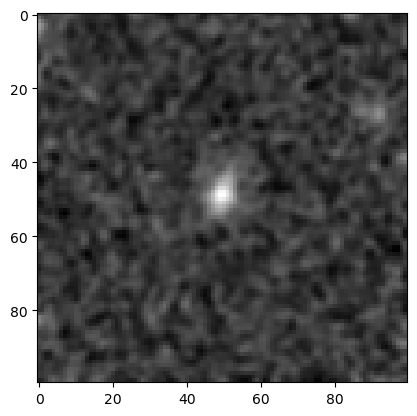

In [126]:
from scipy.ndimage import gaussian_filter

smoothed_data = gaussian_filter(normalized_data, sigma=1)  # sigma in pixels

plt.imshow((smoothed_data), cmap='gray')

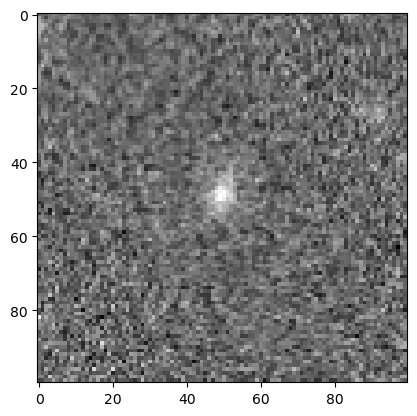

In [124]:
plt.imshow(normalized_data, cmap='gray')

In [36]:
hdul[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
CHECKSUM= '3aA74aA63aA63aA6'   / HDU checksum updated 2025-03-15T00:54:00       
DATASUM = '         0'         / data unit checksum updated 2025-03-15T00:54:00 